# Latest Mark 8

Focused on Optic Cup Segmentation

## Libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from copy import deepcopy
import shapely.geometry as shapgeo

## Preliminary Func

In [2]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir)
    print(f'Figure is successfully saved at {savedir}')

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

## Draw func

In [3]:
def draw_od_line(imgs, roi_line, color):
    odlines = {}
    for img in imgs:
        odlines[img] = cv2.ellipse(imgs[img], 
                                   roi_line[img], 
                                   color, 
                                   3, 
                                   cv2.LINE_AA)
    return odlines

def draw_oc_line(imgs, roi_line, color):
    drawn_oc = {}
    
    for img in imgs:
        drawn_oc[img] = cv2.circle(imgs[img],roi_line[img][0],roi_line[img][1],color, 3)
    return drawn_oc

## Main

In [4]:
home = r'/home/tsdhrm/Pictures/thesis/dataset/100DataAll'

In [5]:
IDEAL = r'/home/tsdhrm/Pictures/thesis/dataset/100DataAll/Positive59.png'

In [6]:
images = read_files(home)
ideal = cv2.imread(IDEAL)
ideal = cv2.cvtColor(ideal, cv2.COLOR_BGR2RGB)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative1.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative10.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative11.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative12.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative13.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative14.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative15.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative16.png...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative17.png...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative18.png...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative19.png...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative2.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataAll/Negative20.png...
reading /home/tsdhrm/Pictures/thesis/dat

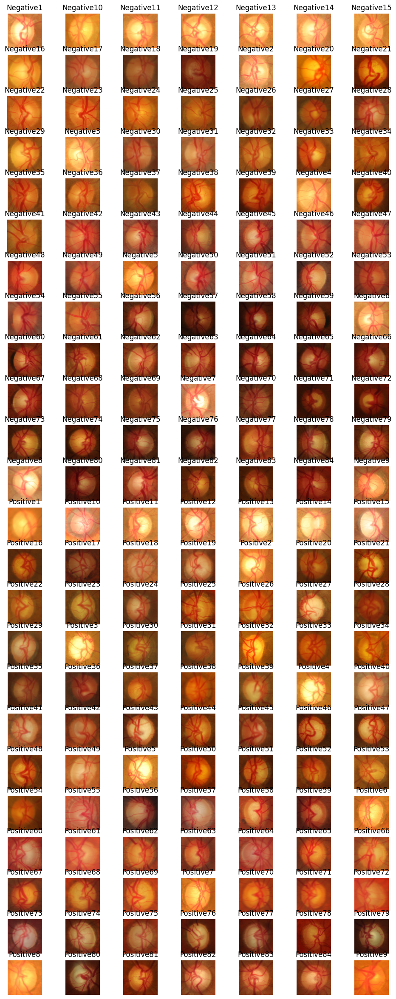

In [7]:
display_all(images, (24,7), (12,30))

## Histogram Matching

In [8]:
from skimage.exposure import match_histograms

In [9]:
images_matched = {}
for image in images:
    images_matched[image] = match_histograms(images[image], ideal, multichannel=True)

/tmp/ipykernel_7239/3803995021.py:3: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  images_matched[image] = match_histograms(images[image], ideal, multichannel=True)


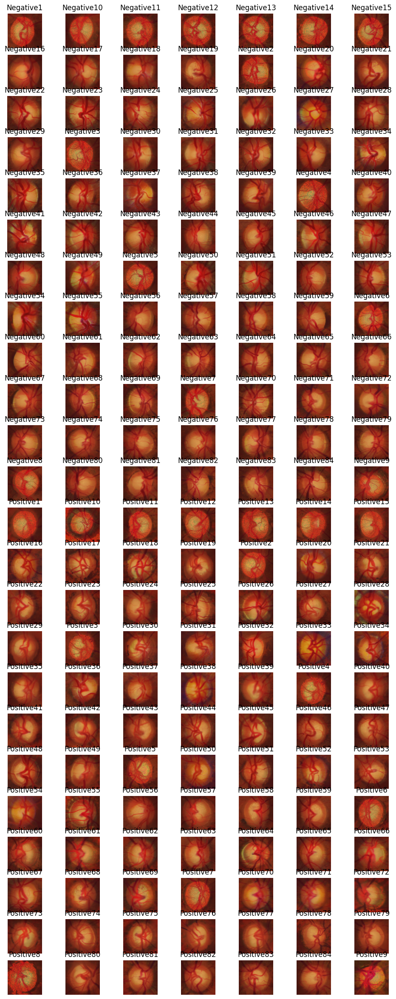

In [10]:
display_all(images_matched, (24,7), (12,30))

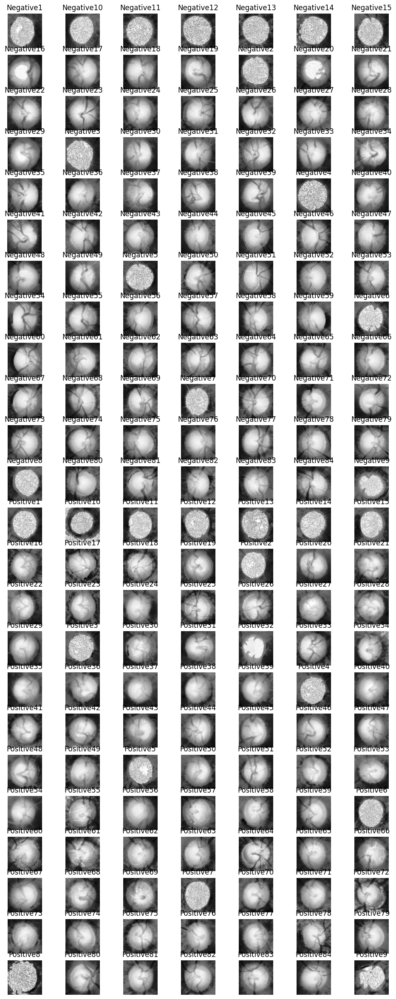

In [11]:
display_all_with(images_matched, 0, (24,7), (12,30), True)

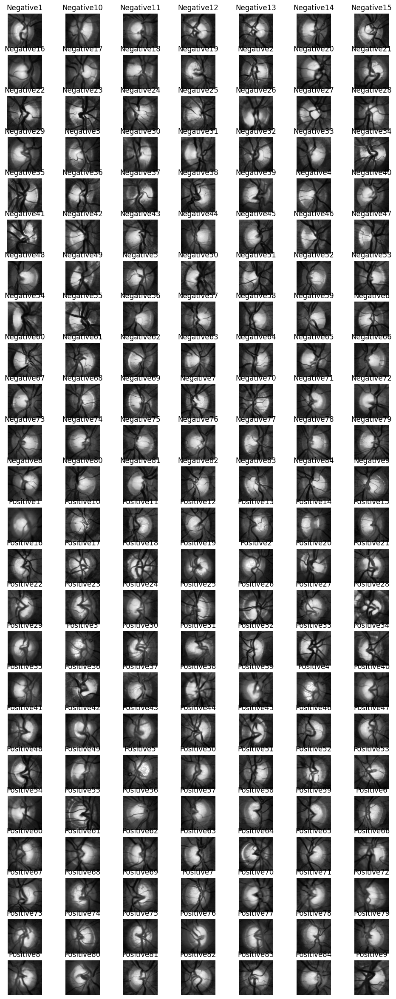

In [12]:
display_all_with(images_matched, 1, (24,7), (12,30), True)

## OC Segmentation

In [182]:
def set_bleeds(img, trim_border=15):
    '''
    A bleed is a small area around the edge of 
    your artwork that extends beyond the “finished” 
    cut edge of your document.
    '''
    img[:, :trim_border] = 0
    img[:trim_border, :] = 0
    img[-trim_border:, :] = 0
    img[:, -trim_border:] = 0
    
    return img

def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def select_boundaries(bnrs):
    cont, hcy = cv2.findContours(bnrs, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    (x,y),radius = get_circle(cont)
    center = (int(x),int(y))
    radius = int(radius)
    return (center, radius)

def extract_oc(imgs):
    # p = {}
    oc_lines = {}
    ocs = {}
    # close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (55,55))
    close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (40,30))
    dil_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20,20))
    clahe = cv2.createCLAHE(5, (5,5))
    
    for img in imgs:
        green = imgs[img][:,:,1]
        gmc = adjust_gamma(green, 3)
        clahed = clahe.apply(gmc)
        gaussianblur = cv2.GaussianBlur(clahed, (5,5), 0)
        ret3, th3 = cv2.threshold(gaussianblur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        bleds = set_bleeds(th3, 100)
        erosion = cv2.morphologyEx(bleds, cv2.MORPH_ERODE, close_kernel)
        binaries = cv2.morphologyEx(erosion, cv2.MORPH_DILATE, dil_kernel)
        center_rad = select_boundaries(binaries)
        oc_lines[img] = center_rad
        canvas = np.zeros_like(th3, dtype='uint8')
        ocs[img] = cv2.circle(canvas, center_rad[0], center_rad[1], (255, 255, 255), -1)
    print('success!')
    # display_all(p, (24,7), (10,30), True)
    return oc_lines, ocs

In [183]:
oc_bound_lines, all_oc = extract_oc(images_matched)

success!


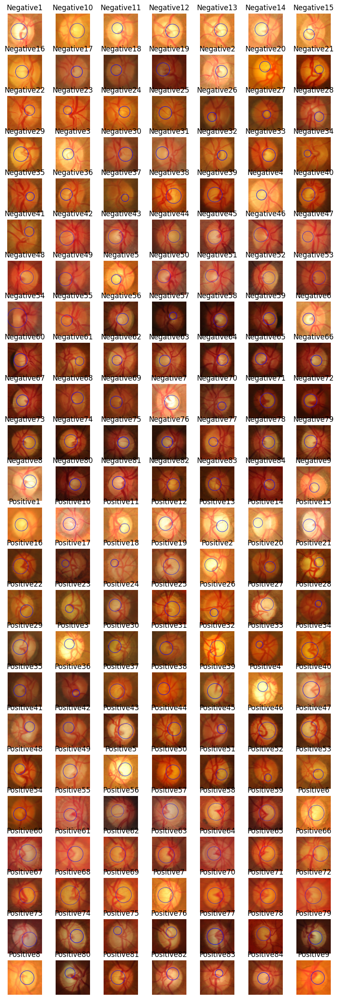

In [184]:
imgc = deepcopy(images)
drawn_oc = draw_oc_line(imgc, oc_bound_lines, (0, 0, 255))
display_all(drawn_oc, (24,7), (10,30))

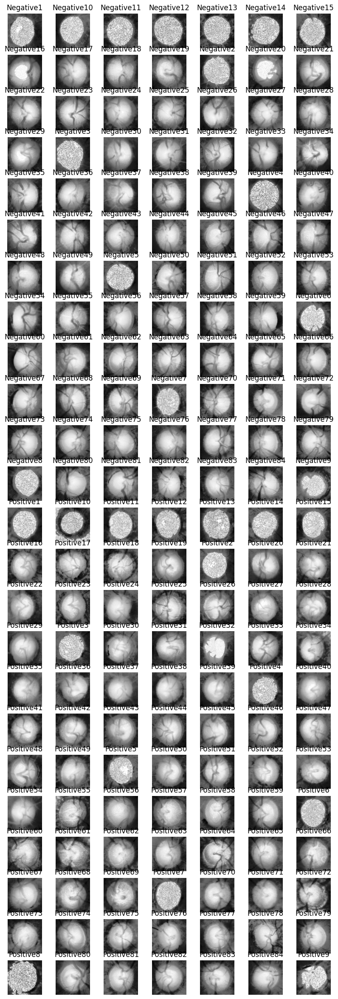

In [73]:
display_all_with(images_matched, 0, (24,7), (10,30))

In [147]:
st = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,30))

In [148]:
print(st)

[[0 0 0 0 0 1 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1]
 [0 0 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0]
 [0 0 0 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0]]
